
# Curso Data Science
## Grupo 10:
### Cravero, Jeronimo
### Oechsle, Tomas
### Scarafia, Oreste
### Zakian, Agustin


## 1) Importacion de librerías y carga del dataset

In [1]:
%matplotlib inline

#Importamos las librerias que seran necesarias:

import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import re
import plotly.express as px


#Habilitamos para que nos muestre hasta 500 columnas

pd.set_option('display.max_columns', 500)

In [2]:
#Levantamos el dataset
data_location = "properatti.csv"

## 2) Exploración del dataset

In [3]:
df = pd.read_csv(data_location)
df.head(20)


,Unnamed: 0,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail
0,0,sell,PH,Mataderos,|Argentina|Capital Federal|Mataderos|,Argentina,Capital Federal,3430787.0,"-34.6618237,-58.5088387",-34.661824,-58.508839,62000.0,USD,1093959.00,62000.00,55.0,40.0,1127.272727,1550.000000,NaN,NaN,NaN,http://www.properati.com.ar/15bo8_venta_ph_mat...,"2 AMBIENTES TIPO CASA PLANTA BAJA POR PASILLO,...",2 AMB TIPO CASA SIN EXPENSAS EN PB,https://thumbs4.properati.com/8/BluUYiHJLhgIIK...
1,1,sell,apartment,La Plata,|Argentina|Bs.As. G.B.A. Zona Sur|La Plata|,Argentina,Bs.As. G.B.A. Zona Sur,3432039.0,"-34.9038831,-57.9643295",-34.903883,-57.964330,150000.0,USD,2646675.00,150000.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,http://www.properati.com.ar/15bob_venta_depart...,Venta de departamento en décimo piso al frente...,VENTA Depto 2 dorm. a estrenar 7 e/ 36 y 37 ...,https://thumbs4.properati.com/7/ikpVBu2ztHA7jv...
2,2,sell,apartment,Mataderos,|Argentina|Capital Federal|Mataderos|,Argentina,Capital Federal,3430787.0,"-34.6522615,-58.5229825",-34.652262,-58.522982,72000.0,USD,1270404.00,72000.00,55.0,55.0,1309.090909,1309.090909,NaN,NaN,NaN,http://www.properati.com.ar/15bod_venta_depart...,2 AMBIENTES 3ER PISO LATERAL LIVING COMEDOR AM...,2 AMB 3ER PISO CON ASCENSOR APTO CREDITO,https://thumbs4.properati.com/5/SXKr34F_IwG3W_...
3,3,sell,PH,Liniers,|Argentina|Capital Federal|Liniers|,Argentina,Capital Federal,3431333.0,"-34.6477969,-58.5164244",-34.647797,-58.516424,95000.0,USD,1676227.50,95000.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,http://www.properati.com.ar/15boh_venta_ph_lin...,PH 3 ambientes con patio. Hay 3 deptos en lote...,PH 3 amb. cfte. reciclado,https://thumbs4.properati.com/3/DgIfX-85Mog5SP...
4,4,sell,apartment,Centro,|Argentina|Buenos Aires Costa Atlántica|Mar de...,Argentina,Buenos Aires Costa Atlántica,3435548.0,"-38.0026256,-57.5494468",-38.002626,-57.549447,64000.0,USD,1129248.00,64000.00,35.0,35.0,1828.571429,1828.571429,NaN,NaN,NaN,http://www.properati.com.ar/15bok_venta_depart...,DEPARTAMENTO CON FANTÁSTICA ILUMINACIÓN NATURA...,DEPTO 2 AMB AL CONTRAFRENTE ZONA CENTRO/PLAZA ...,https://thumbs4.properati.com/5/xrRqlNcSI_vs-f...
5,5,sell,house,Gualeguaychú,|Argentina|Entre Ríos|Gualeguaychú|,Argentina,Entre Ríos,3433657.0,"-33.0140714,-58.519828",-33.014071,-58.519828,NaN,NaN,NaN,NaN,53.0,NaN,NaN,NaN,NaN,NaN,NaN,http://www.properati.com.ar/15bop_venta_depart...,"Casa en el perímetro del barrio 338, ubicada e...","Casa Barrio 338. Sobre calle 3 de caballería, ...",https://thumbs4.properati.com/6/q-w68gvaUEQVXI...
6,6,sell,PH,Munro,|Argentina|Bs.As. G.B.A. Zona Norte|Vicente Ló...,Argentina,Bs.As. G.B.A. Zona Norte,3430511.0,"-34.5329567,-58.5217825",-34.532957,-58.521782,130000.0,USD,2293785.00,130000.00,106.0,78.0,1226.415094,1666.666667,NaN,NaN,NaN,http://www.properati.com.ar/15bor_venta_ph_mun...,MUY BUEN PH AL FRENTE CON ENTRADA INDEPENDIENT...,"MUY BUEN PH AL FRENTE DOS DORMITORIOS , PATIO,...",https://thumbs4.properati.com/5/6GOXsHCyDu1aGx...
7,7,sell,apartment,Belgrano,|Argentina|Capital Federal|Belgrano|,Argentina,Capital Federal,3436077.0,"-34.5598729,-58.443362",-34.559873,-58.443362,138000.0,USD,2434941.00,138000.00,45.0,40.0,3066.666667,3450.000000,NaN,NaN,NaN,http://www.properati.com.ar/15bot_venta_depart...,EXCELENTE MONOAMBIENTE A ESTRENAR AMPLIO SUPER...,JOSE HERNANDEZ 1400 MONOAMBIENTE ESTRENAR CAT...,https://thumbs4.properati.com/1/IHxARynlr8sPEW...
8,8,sell,apartment,Belgrano,|Argentina|Capital Federal|Belgrano|,Argentina,Capital Federal,3436077.0,"-34.5598729,-58.443362",-34.559873,-58.443362,195000.0,USD,3440677.50,195000.00,65.0,60.0,3000.000000,3250.000000,NaN,NaN,NaN,http://www.properati.com.ar/15bou_venta_depart...,EXCELENTE DOS AMBIENTES ESTRENAR AMPLIO SUPER...,"JOSE HERN

In [9]:
df.loc[df.currency=="USD","price"].equals(df.loc[df.currency=="USD","price_aprox_usd"])q1w2e34r5t6y7u8i9o0p[-]\+
+6547/ RTYUIO9654321+++-*=-0

True

In [4]:
df.shape
print("Columnas:",df.shape[0],"/ Filas:", df.shape[1])

Columnas: 121220 / Filas: 26


In [5]:
#Vemos los nombres de las columnas
df.columns

Index(['Unnamed: 0', 'operation', 'property_type', 'place_name',
       'place_with_parent_names', 'country_name', 'state_name', 'geonames_id',
       'lat-lon', 'lat', 'lon', 'price', 'currency',
       'price_aprox_local_currency', 'price_aprox_usd', 'surface_total_in_m2',
       'surface_covered_in_m2', 'price_usd_per_m2', 'price_per_m2', 'floor',
       'rooms', 'expenses', 'properati_url', 'description', 'title',
       'image_thumbnail'],
      dtype='object')

In [6]:
#Analizamos la informacion de las columnas
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 121220 entries, 0 to 121219
Data columns (total 26 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   Unnamed: 0                  121220 non-null  int64  
 1   operation                   121220 non-null  object 
 2   property_type               121220 non-null  object 
 3   place_name                  121197 non-null  object 
 4   place_with_parent_names     121220 non-null  object 
 5   country_name                121220 non-null  object 
 6   state_name                  121220 non-null  object 
 7   geonames_id                 102503 non-null  float64
 8   lat-lon                     69670 non-null   object 
 9   lat                         69670 non-null   float64
 10  lon                         69670 non-null   float64
 11  price                       100810 non-null  float64
 12  currency                    100809 non-null  object 
 13  price_aprox_lo

In [7]:
#Obtenemos valores relevantes sobre el dataset
df.describe()

,Unnamed: 0,geonames_id,lat,lon,price,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses
count,121220.000000,1.025030e+05,69670.000000,69670.000000,1.008100e+05,1.008100e+05,1.008100e+05,81892.000000,101313.000000,68617.000000,8.765800e+04,7899.000000,47390.000000,1.426200e+04
mean,60609.500000,3.574442e+06,-34.626210,-59.266290,4.685259e+05,4.229397e+06,2.397006e+05,233.795328,133.050181,2160.086916,6.912216e+03,17.452336,3.080840,5.009234e+03
std,34993.344153,3.541306e+05,1.980936,2.299922,2.260101e+06,6.904714e+06,3.913239e+05,1782.222147,724.351479,2759.288621,2.837864e+04,120.243621,1.860773,1.204403e+05
min,0.000000,3.427208e+06,-54.823985,-75.678931,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.600000,1.510204e+00,1.000000,1.000000,1.000000e+00
25%,30304.750000,3.430234e+06,-34.669065,-58.727040,1.100000e+05,1.583309e+06,8.973388e+04,50.000000,45.000000,1218.181818,1.550000e+03,1.000000,2.000000,1.000000e+03
50%,60609.500000,3.433910e+06,-34.597985,-58.480128,1.850000e+05,2.558452e+06,1.450000e+05,84.000000,75.000000,1800.000000,2.213115e+03,3.000000,3.000000,2.000000e+03
75%,90914.250000,3.836668e+06,-34.441299,-58.395908,4.200000e+05,4.675792e+06,2.650000e+05,200.000000,150.000000,2486.411765,3.355549e+03,6.000000,4.000000,4.000000e+03
max,121219.000000,6.948895e+06,4.545843,-53.733330,6.500000e+08,8.212711e+08,4.654544e+07,200000.000000,187000.000000,206333.333333,4.000000e+06,3150.000000,32.000000,1.000150e+07


### 2.2 Análisis de valores nulos

In [8]:
#Se calcula el porcentaje de valores nulos en cada una de las columnas
(df.isnull().sum()/len(df)).sort_values(ascending=False)

floor                         0.934837
expenses                      0.882346
rooms                         0.609058
price_usd_per_m2              0.433947
lon                           0.425260
lat-lon                       0.425260
lat                           0.425260
surface_total_in_m2           0.324435
price_per_m2                  0.276869
currency                      0.168380
price_aprox_usd               0.168372
price_aprox_local_currency    0.168372
price                         0.168372
surface_covered_in_m2         0.164222
geonames_id                   0.154405
image_thumbnail               0.025672
place_name                    0.000190
description                   0.000016
title                         0.000000
properati_url                 0.000000
state_name                    0.000000
country_name                  0.000000
place_with_parent_names       0.000000
property_type                 0.000000
operation                     0.000000
Unnamed: 0               

In [9]:
#Cantidad de nulos por columna
missing = df.isnull().sum()
missing= missing.reset_index()
missing.columns=["features", "q_missing"]
missing

,features,q_missing
0,Unnamed: 0,0
1,operation,0
2,property_type,0
3,place_name,23
4,place_with_parent_names,0
5,country_name,0
6,state_name,0
7,geonames_id,18717
8,lat-lon,51550
9,lat,51550


In [10]:
#Otra forma de calcular el porcentaje de valores faltantes por columna
for i in missing.index:
    if missing["q_missing"][i]>0:
        porcen = (missing["q_missing"][i]/len(df))*100
        porcen = "{0:.2f}%".format(porcen)
        print('Lo valores faltantes de la columna "',missing['features'][i],
          '" representan el',porcen,'de todas las instancias')

Lo valores faltantes de la columna " place_name " representan el 0.02% de todas las instancias
Lo valores faltantes de la columna " geonames_id " representan el 15.44% de todas las instancias
Lo valores faltantes de la columna " lat-lon " representan el 42.53% de todas las instancias
Lo valores faltantes de la columna " lat " representan el 42.53% de todas las instancias
Lo valores faltantes de la columna " lon " representan el 42.53% de todas las instancias
Lo valores faltantes de la columna " price " representan el 16.84% de todas las instancias
Lo valores faltantes de la columna " currency " representan el 16.84% de todas las instancias
Lo valores faltantes de la columna " price_aprox_local_currency " representan el 16.84% de todas las instancias
Lo valores faltantes de la columna " price_aprox_usd " representan el 16.84% de todas las instancias
Lo valores faltantes de la columna " surface_total_in_m2 " representan el 32.44% de todas las instancias
Lo valores faltantes de la columna

<Figure size 1080x432 with 0 Axes>

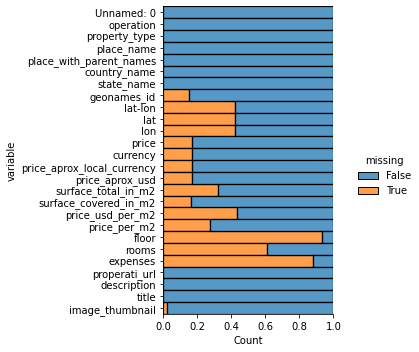

In [11]:
#Se representa con un grafico los valores faltantes como "missing". Los mismos serian valores faltantes por variable.
plt.figure(figsize=(15,6))
sns.displot(data=df.isna().melt(value_name="missing"), y="variable", hue="missing", multiple="fill", aspect=1)

###  2.3) Análisis de valores duplicados

In [12]:
#DROPEO DUPLICADOS EN COLUMNAS ESPECIFICADAS EN SUBSET.
df = df.drop_duplicates(subset=['property_type','place_name','place_with_parent_names','country_name','state_name'
                    ,'geonames_id','lat-lon','lat','lon','price_usd_per_m2','price_per_m2'
                    ,'price','currency','price_aprox_local_currency','price_aprox_usd','surface_total_in_m2'
                    ,'surface_covered_in_m2',"description"])

df.shape


(115161, 26)

### 2.4) Análisis de columnas que no aporten ningun valor agregado

In [13]:
#Vemos la columna operation tiene solamente un valor = "sell", por ende puede descartarse.
df.operation.unique()

#Vemos la columna country_name tiene solamente un valor = "Argentina", por ende puede descartarse.
df.country_name.unique()

#Las columnas que nos proporcionan URL's tampoco las consideramos importantes, por ende tambien las retiramos.

df = df.drop(["operation","country_name","image_thumbnail","properati_url"], axis=1)

## 3) Análisis de la distribución de los datos

### 3.1) Análisis de tipos de propiedades

In [14]:
#Observamos los tipos de propiedades que existen
df.property_type.unique()
df.property_type.value_counts()

apartment    65849
house        39656
PH            5597
store         4059
Name: property_type, dtype: int64

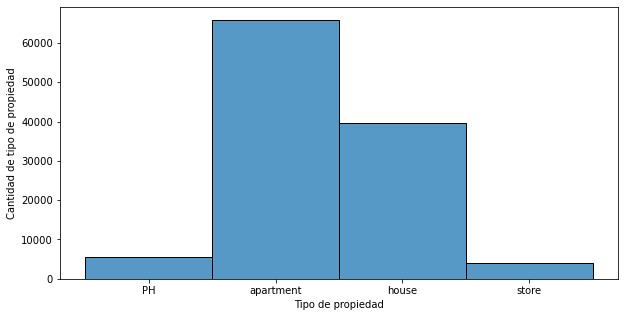

In [15]:
#Miramos que tipos de propiedades son las que mas observaciones tiene
fig = plt.figure(figsize=(10,5)); ax = plt.axes()

ax = sns.histplot(data=df, x="property_type")

ax.set(xlabel = "Tipo de propiedad", ylabel = "Cantidad de tipo de propiedad")
plt.show()


### 3.2) Análisis de place_name

In [16]:
#Vemos que place_name tiene 23 datos faltantes
df.place_name.isnull().sum()

23

In [17]:
#Generamos una mascara para observar el DF general con los valores de place_name nulos y ver a cual corresponde utilizando
#la columna place_with_parent_names.
place_name_null_mask = df.place_name.isnull()
df[place_name_null_mask]

,Unnamed: 0,property_type,place_name,place_with_parent_names,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,description,title
6489,6489,house,NaN,|Argentina|Bs.As. G.B.A. Zona Norte|Tigre||,Bs.As. G.B.A. Zona Norte,NaN,"-34.4008968545,-58.63809847",-34.400897,-58.638098,650000.0,USD,11468925.0,650000.0,240.0,240.0,2708.333333,2708.333333,NaN,NaN,NaN,"Espectacular casa moderna de una planta, con a...",Venta de casa en Santa María de Tigre
10201,10201,house,NaN,|Argentina|Bs.As. G.B.A. Zona Norte|Tigre||,Bs.As. G.B.A. Zona Norte,NaN,"-34.400704,-58.638067",-34.400704,-58.638067,535000.0,USD,9439807.5,535000.0,NaN,300.0,NaN,1783.333333,NaN,5.0,NaN,Corredor Responsable: SABRINA COCCONI - CSI 62...,VENTA CASA SANTA MARÍA DE TIGRE COUNTRY BARRIO...
11451,11451,house,NaN,|Argentina|Bs.As. G.B.A. Zona Norte|Tigre||,Bs.As. G.B.A. Zona Norte,NaN,"-34.4026880384,-58.6262613379",-34.402688,-58.626261,550000.0,USD,9704475.0,550000.0,2170.0,270.0,253.456221,2037.037037,NaN,NaN,NaN,MUY LINDA CASA EN EXCELENTE UBICACION!! Superf...,SANTA MARIA DE TIGRE IMPECABLE
14839,14839,house,NaN,|Argentina|Bs.As. G.B.A. Zona Norte|Tigre||,Bs.As. G.B.A. Zona Norte,NaN,"-34.4007994779,-58.6381735719",-34.400799,-58.638174,480000.0,USD,8469360.0,480000.0,240.0,200.0,2000.000000,2400.000000,NaN,NaN,NaN,Muy linda casa de estilo clásico.-Planta baja;...,Venta de casa en Santa María de Tigre
18622,18622,house,NaN,|Argentina|Bs.As. G.B.A. Zona Norte|Tigre||,Bs.As. G.B.A. Zona Norte,NaN,"-34.4032781195,-58.6263503945",-34.403278,-58.626350,1297000.0,USD,22884916.5,1297000.0,340.0,340.0,3814.705882,3814.705882,NaN,NaN,NaN,Casa con increible vista al lago con playa de...,Casa con increible vista al lago con playa y m...
21922,21922,house,NaN,|Argentina|Bs.As. G.B.A. Zona Norte|Tigre||,Bs.As. G.B.A. Zona Norte,NaN,"-34.399704,-58.638405",-34.399704,-58.638405,440000.0,USD,7763580.0,440000.0,NaN,220.0,NaN,2000.000000,NaN,5.0,NaN,Corredor Responsable: Matias Castelli - CUCICB...,Venta Casa - Barrio Santa Maria de Tigre
23664,23664,house,NaN,|Argentina|Bs.As. G.B.A. Zona Norte|Tigre||,Bs.As. G.B.A. Zona Norte,NaN,"-34.4005161998,-58.6417999185",-34.400516,-58.641800,480000.0,USD,8469360.0,480000.0,294.0,294.0,1632.653061,1632.653061,NaN,NaN,NaN,EXCELENTE CASA CLASICA con grandes ventanas y ...,CASA EN VENTA EN SANTA MARIA DE TIGRE CON RENTA
24722,24722,house,NaN,|Argentina|Bs.As. G.B.A. Zona Norte|Tigre||,Bs.As. G.B.A. Zona Norte,NaN,"-34.4007292,-58.6377783",-34.400729,-58.637778,530000.0,USD,9351585.0,530000.0,316.0,270.0,1677.215190,1962.962963,NaN,NaN,NaN,"EN EXCLUSIVIDAD!!!!!!Lindísima casa, muy lumin...",Venta de casa en Santa María de Tigre
38856,38856,house,NaN,|Argentina|Bs.As. G.B.A. Zona Norte|Tigre||,Bs.As. G.B.A. Zona Norte,NaN,"-34.425087,-58.5796585",-34.425087,-58.579659,1350000.0,USD,23820075.0,1350000.0,NaN,550.0,NaN,2454.545455,NaN,NaN,NaN,SANTA MARIA DE TIGRE- AL RIO - ESPECTACULAR CA...,"Casa (barrio cerrado), Venta"
45970,45970,apartment,NaN,|Argentina|Bs.As. G.B.A. Zona Norte|Tigre||,Bs.As. G.B.A. Zona Norte,NaN,"-34.396074,-58.63738",-34.396074,-58.637380,95000.0,USD,1676227.5,95000.0,55.0,27.0,1727.272727,3518.518519,NaN,1.0,NaN,"EDIFICIO ZERENA – EL PALMAR, NORDELTA. Torre 2...",Excelente monoambiente. Barrio El Palmar. Con...


Observamos que en la columna place_name hay 23 datos faltantes que pertenecen a Tigre

In [18]:
#Reemplazamos con un apply los valores nulos por la localidad correspondiente.
df.place_name = df.place_name.apply(lambda x: "Tigre" if x is np.NaN else x)
df.place_name.replace("coordenadas 34.255511","Tigre", inplace=True)
df.place_name.isnull().sum()


#A continuacion se muestra otra forma de hacer lo mismo

#place_name_null_mask = df.place_name.isnull()
#x = list(set(df.place_name[place_name_null_mask]))
#df.place_name.replace(x,"Tigre", inplace=True)
#df.place_name.isnull().sum()

0

Observamos que los 23 datos faltantes han sido completados de forma exitosa

### 3.2) Análisis de "geonames_id"

In [19]:
df.geonames_id.isnull().sum()

18004

In [20]:
#Rellenamos los valores de geonames_id con los valores que ya tengo, provenientes de'place_name' y 'state_name'.
df["place_state_name"] = df.place_name + "" + df.state_name
df_1 = df[df.geonames_id.notnull()].sort_values(by="place_state_name", ascending=False)

diccionario = dict(zip(df_1.place_state_name,df_1.geonames_id))
diccionario
df.geonames_id= df.geonames_id.fillna(df.place_state_name.map(diccionario))
df.geonames_id.isnull().sum()

13751

### 3.3) Análisis de state_name

In [21]:
#OBSERVAMOS LAS ZONAS CON MAYOR CANTIDAD DE PROPIEDADES

#VEMOS QUE LOS PRIMEROS 7 REPRESENTAN CASI EL 80% DE LOS DATOS.
mascara = df.state_name.value_counts().head(7).index
df["state_name1"] = df.state_name.apply(lambda x: x if x in mascara else "Otros")
dfx = df.state_name1.value_counts().reset_index()
dfx.columns=["Barrio","Cantidad"]
dfx["% total"] = dfx["Cantidad"]/dfx["Cantidad"].sum()
dfx

,Barrio,Cantidad,% total
0,Capital Federal,30479,0.264664
1,Bs.As. G.B.A. Zona Norte,24540,0.213093
2,Bs.As. G.B.A. Zona Sur,13497,0.117201
3,Córdoba,11457,0.099487
4,Buenos Aires Costa Atlántica,9874,0.085741
5,Santa Fe,8960,0.077804
6,Bs.As. G.B.A. Zona Oeste,8941,0.077639
7,Otros,7413,0.064371


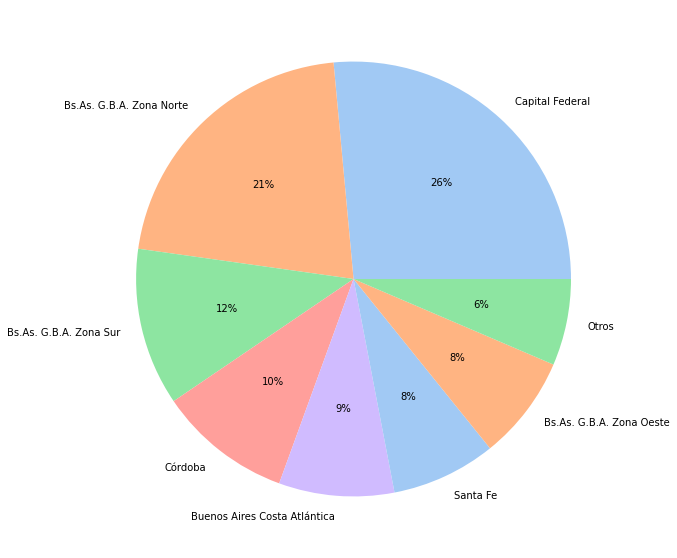

In [22]:
fig= plt.figure(figsize=(20,10))
colors = sns.color_palette('pastel')[0:5]
plt.pie(x= dfx["% total"], labels =dfx.Barrio, colors = colors, autopct='%.0f%%')
plt.show()

In [23]:
#Quitamos del df la columna "state_name1" porque se creó unicamente para realizar el gráfico previo. 
df.drop(["state_name1"],axis=1, inplace=True)

### 3.3) Análisis de latitud y longitud

In [24]:
#VAMOS A VER SI LOS VALORES DE LA COLUMNA LAT-LON CORRESPONDEN A LOS VALORES DE LAT Y LON.

lat = df["lat-lon"].apply(lambda x: x if x is np.NaN else x.split(",")[0])
lon=df["lat-lon"].apply(lambda x: x if x is np.NaN else x.split(",")[1])
print(lat.dtypes,lon.dtypes)

#AL VER QUE SON OBJECTS AMBAS SERIES CREADAS DEBO PASARLAS A FLOAT Y SACAR TODOS AQUELLOS NULOS. LAS COLUMNAS LAT Y LON 
#YA DE POR SI SON DE TIPO FLOAT.

lat = lat[lat.notnull()].astype(float)
lon = lon[lon.notnull()].astype(float)

df_lat = df.lat[df.lat.notnull()]
df_lon = df.lon[df.lon.notnull()]

print(all(np.round(df_lat,4)==np.round(lat,4)))
print(all(np.round(df_lon,4)==np.round(lon,4)))

object object
True
True


Vemos que si corresponden

In [25]:
#Eliminamos la columna "lat-lon" porque el dato ya se encuentra en las columnas 'lat' y 'lon'
df = df.drop(["lat-lon"], axis=1)

### 3.4) Análisis de tipos de monedas

Identificaremos los tipos de monedas y luego eliminaremos aquellas que no son relevantes

In [26]:
df.currency.unique()

array(['USD', nan, 'ARS', 'PEN', 'UYU'], dtype=object)

### 3.5) Análisis de "price_usd_per_m2"

In [27]:
#Chequeo posibles outliers de la columna price_aprox_usd
fig = px.box(df, x="rooms", y="price_usd_per_m2", color="property_type")

fig.update_layout(
    title="Ambientes de las propiedades por su precio en USD",
    xaxis_title="Ambientes",
    yaxis_title="Precio por m2 de las propiedades en USD")

fig.update_layout(
    xaxis = dict(
        tickmode = 'linear'))
fig.show()

### 3.6) Análisis de columnas title y description

#### Se aplicará regex para luego comenzar con el proceso de imputación

In [28]:

print(f"Cantidad de nulos en un inicio en la columna rooms: {df.rooms.isnull().sum()}")


#FALTA DE CUARTOS EN COLUMNA TITLE
patron_ambiente = "(?P<ambs>(\d{1,2}))\s?(?P<ambdorm>dorm|amb)"
regex_ambiente = re.compile(patron_ambiente, re.IGNORECASE)
matches_ambientes= df.title.apply(lambda x: x if x is np.NaN else regex_ambiente.search(x))
matches_ambientes_mask = matches_ambientes.notnull()
matches_ambientes_not_null = matches_ambientes[matches_ambientes_mask]
print(f"Cantidad de matches de rooms en la columna title: {matches_ambientes_not_null.notnull().sum()}")

#GENERO COPIA NUEVA
df1 = df.copy()

#CREO COLUMNA NUEVA
df1["new_rooms_from_title"] = matches_ambientes_not_null.apply(lambda x: x.group("ambs"))

#FALTA DE CUARTOS EN COLUMNA DESCRIPTION
patron_ambiente_desc = "(?P<ambs1>(\d{1,2}))\s?(?P<ambdorm>dorm|amb)"
regex_ambiente_desc = re.compile(patron_ambiente_desc, re.IGNORECASE)
matches_ambientes_desc= df.description.apply(lambda x: x if x is np.NaN else regex_ambiente_desc.search(x))
matches_ambientes_desc_mask = matches_ambientes_desc.notnull()
matches_ambientes_desc_not_null = matches_ambientes_desc[matches_ambientes_desc_mask]
print(f"Cantidad de matches de rooms en la columna description: {matches_ambientes_desc_not_null.notnull().sum()}")


#CREO COLUMNA NUEVA A PARTIR DE DESCRIPTION
df1["new_rooms_from_desc"] = matches_ambientes_desc_not_null.apply(lambda x: x.group("ambs1"))




Cantidad de nulos en un inicio en la columna rooms: 69420
Cantidad de matches de rooms en la columna title: 28468
Cantidad de matches de rooms en la columna description: 66157


#### COMPLETAMOS VALORES NULOS DE 'ROOMS' POR VALORES ENCONTRADOS EN 'DESCRIPTION' Y 'TITLE'

In [29]:
#REPLETO VALORES NULOS DE COLUMNA ORIGINAL "ROOMS" POR VALORES DE NEW_ROOMS_FROM_TITLE Y A LOS NaN RESTANTES CON 
#NEW_ROOMS_FROM_DESC

df1.rooms = df1.rooms.fillna(df1.new_rooms_from_title)
df1.rooms = df1.rooms.fillna(df1.new_rooms_from_desc)



#CREO DATAFRAME NUEVO SACANDO LAS COLUMNAS CREADAS ANTERIORMENTE
df2 = df1.drop(["new_rooms_from_title","new_rooms_from_desc"],axis=1)

print(f"Cantidad de nulos en columna rooms al rellenar con lo anterior: {df2.rooms.isnull().sum()}")

Cantidad de nulos en columna rooms al rellenar con lo anterior: 29952


#### BUSCAMOS EN COLUMNA 'TITLE' EL PATRON 'MONOAMBIENTE'

In [30]:
#BUSCO EN TITLE LOS QUE DIGAN MONOAMBIENTE

patron_monoambiente = "(?P<monoambs>[a-zA-Z]?monoamb)"
regex_monoambiente = re.compile(patron_monoambiente, re.IGNORECASE)
matches_monoambientes= df2.title.apply(lambda x: x if x is np.NaN else regex_monoambiente.match(x))
matches_monoambientes_mask = matches_monoambientes.notnull()
matches_monoambientes_not_null = matches_monoambientes[matches_monoambientes_mask]
print(f"Cantidad de matches de monoambientes en columna title: {matches_monoambientes_not_null.notnull().sum()}")

#CREO COLUMNA NUEVA CON LOS MATCHES
df2["new_rooms_monoambientes"] = matches_monoambientes_not_null.apply(lambda x: x.group("monoambs"))

#REEMPLAZO LOS VALORES DE MONOAMBIENTE POR 1, POR LO QUE LO PRIMERO QUE HAGO ES VEO CUALES SON
#df2.new_rooms_monoambientes.unique()
df2.new_rooms_monoambientes.replace(['Monoamb', 'MONOAMB', 'monoamb', 'MonoAmb'], 1, inplace=True)



Cantidad de matches de monoambientes en columna title: 1278


#### BUSCAMOS EN COLUMNA 'DESCRIPTION' EL PATRON 'MONOAMBIENTE'

In [31]:
#BUSCO EN DESCRIPCION LOS QUE DIGAN MONOAMBIENTE

patron_monoambiente_desc = "(?P<monoambs1>[a-zA-Z]?monoamb)"
regex_monoambiente_desc = re.compile(patron_monoambiente_desc, re.IGNORECASE)
matches_monoambientes_desc= df2.description.apply(lambda x: x if x is np.NaN else regex_monoambiente_desc.match(x))
matches_monoambientes_desc_mask = matches_monoambientes_desc.notnull()
matches_monoambientes_desc_not_null = matches_monoambientes_desc[matches_monoambientes_desc_mask]
print(f"Cantidad de matches de monoambientes en columna title: {matches_monoambientes_desc_not_null.notnull().sum()}")

#CREO COLUMNA NUEVA CON LOS MATCHES
df2["new_rooms_monoambientes_desc"] = matches_monoambientes_desc_not_null.apply(lambda x: x.group("monoambs1"))

#REEMPLAZO LOS VALORES DE MONOAMBIENTE POR 1, POR LO QUE LO PRIMERO QUE HAGO ES VEO CUALES SON
#print(df3.new_rooms_monoambientes_desc.unique())
df2.new_rooms_monoambientes_desc.replace(['Monoamb', 'MONOAMB', 'monoamb', 'MonoAmb'], 1, inplace=True)



Cantidad de matches de monoambientes en columna title: 810


#### COMPLETAMOS LOS VALORES ENCONTRADOS EN LAS CELDAS VACIAS

In [32]:
#RELLENAMOS LOS VALORES NULOS DE LA COLUMNA ROOMS
df2.rooms = df2.rooms.fillna(df2.new_rooms_monoambientes)
df2.rooms = df2.rooms.fillna(df2.new_rooms_monoambientes_desc)


df3 = df2.drop(["new_rooms_monoambientes","new_rooms_monoambientes_desc"], axis=1)



#### CHEQUEAMOS EL PORCENTAJE DE ROOMS NULOS QUE TENGO AHORA RESPECTO AL PROCENTAJE DE ROOMS NULOS EN UN PRINCIPIO

In [33]:
valores_nulos_actuales = df3.rooms.isnull().sum()/df3.shape[0]
valores_nulos_originales = df.rooms.isnull().sum()/df.shape[0]
print(f"El porcentaje de valores nulos originales era: {valores_nulos_originales}")
print(f"El porcentaje de valores nulos actuales es: {valores_nulos_actuales}")

El porcentaje de valores nulos originales era: 0.6028082423737202
El porcentaje de valores nulos actuales es: 0.25348859422894904


#### APLICAMOS REGEX PARA CONSEGUIR DATOS FALTANTES DE PRECIO

In [34]:
print(f"Cantidad de nulos en la columna price_aprox_usd: {df3.price_aprox_usd.isnull().sum()}")

#VAMOS A COMPLETAR VALORES DE PRICE_APROX_USD CON VALORES A PARTIR DE LA COLUMNA DESCRIPTION
pattern_usd = "(?P<moneda_desc>U\$S|USD|U\$|u\$d|ud|us|dls)\s?(?P<precio_desc>\d+\.?\d+)"
patter_usd_regex = re.compile(pattern_usd,re.IGNORECASE)
matches_usd = df3.description.apply(lambda x: x if x is np.NaN else patter_usd_regex.search(x))
matches_usd_mask = matches_usd.notnull()
matches_usd_not_null = matches_usd[matches_usd_mask]
print(f"Cantidad de matches de precios en la columna 'description': {matches_usd_not_null.notnull().sum()}")

df3["precios_usd_desc"] = matches_usd_not_null.apply(lambda x: x.group("precio_desc"))


#VAMOS A COMPLETAR VALORES DE PRICE_APROX_USD CON VALORES A PARTIR DE LA COLUMNA TITLE
pattern_usd_title = "(?P<moneda_title>U\$S|USD|U\$|u\$d|ud|us)\s?(?P<precio_title>\d+\.?\d+)"
pattern_usd_title_regex = re.compile(pattern_usd_title, re.IGNORECASE)
matches_usd_title = df3.title.apply(lambda x: x if x is np.NaN else pattern_usd_title_regex.search(x))
matches_usd_title_mask = matches_usd_title.notnull()
matches_usd_title_not_null = matches_usd_title[matches_usd_title_mask]
print(f"Cantidad de matches de precios en la columna 'title': {matches_usd_title_not_null.notnull().sum()}") 

df3["precios_usd_title"] = matches_usd_title_not_null.apply(lambda x: x.group("precio_title"))


Cantidad de nulos en la columna price_aprox_usd: 17269
Cantidad de matches de precios en la columna 'description': 12237
Cantidad de matches de precios en la columna 'title': 6651


In [35]:
df3.price_aprox_usd = df3.price_aprox_usd.fillna(df3.precios_usd_desc)
df3.price_aprox_usd = df3.price_aprox_usd.fillna(df3.precios_usd_title)

df4 = df3.drop(["precios_usd_desc","precios_usd_title"], axis=1)
print(f"Cantidad de precios nulos luego de aplicar expresiones regulares: {df4.price_aprox_usd.isnull().sum()}")

Cantidad de precios nulos luego de aplicar expresiones regulares: 14767


#### CHEQUEAMOS EL PORCENTAJE DE PRECIOS NULOS QUE TENGO AHORA RESPECTO AL PROCENTAJE DE PRECIOS NULOS EN UN PRINCIPIO

In [36]:
precios_nulos_actuales = df4.price_aprox_usd.isnull().sum()/df4.shape[0]
precios_nulos_originales = df.price_aprox_usd.isnull().sum()/df.shape[0]
print(f"El porcentaje de precios nulos originales era: {precios_nulos_originales}")
print(f"El porcentaje de precios nulos actuales es: {precios_nulos_actuales}")

El porcentaje de precios nulos originales era: 0.14995527999930533
El porcentaje de precios nulos actuales es: 0.1282291748074435


#### APLICAMOS REGEX PARA COMPLETAR DATOS FALTANTES DE SUPERFICIE CUBIERTA

In [37]:
#VOY A COMPLETAR DATOS DE LA SUPERFICIE CUBIERTA A PARTIR DE LA COLUMNA DESCRIPCION:

print(f"Cantidad de nulos en la columna de superficie cubierta: {df4.surface_covered_in_m2.isnull().sum()}") 


pattern_m2_cubiertos= "(?P<mcubiertos>\d+\.?\d+)\s?((m2)|([mts]2?)|(metros cuadrados))\s?cub"
pattern_m2_cubiertos_regex = re.compile(pattern_m2_cubiertos,re.IGNORECASE)
matches_m2_cubiertos = df4.description.apply(lambda x: x if x is np.NaN else pattern_m2_cubiertos_regex.search(x))
matches_m2_cubiertos_mask = matches_m2_cubiertos.notnull()
matches_m2_cubiertos_not_null = matches_m2_cubiertos[matches_m2_cubiertos_mask]
print(f"Cantidad de matches de superficie cubierta en la columna description: {matches_m2_cubiertos_not_null.notnull().sum()}")

df4["metros_cubiertos_desc"] = matches_m2_cubiertos_not_null.apply(lambda x: x.group("mcubiertos"))

#VOY A COMPLETAR DATOS DE LA SUPERFICIE CUBIERTA A PARTIR DE LA COLUMNA TITLE:

pattern_m2_cubiertos_title = "(?P<mcubiertos_title>\d+\.?\d+)\s?((m2)|([mts]2?)|(metros cuadrados))\s?cub"
m2_cubiertos_title_regex = re.compile(pattern_m2_cubiertos_title , re.IGNORECASE)
matches_m2_cubiertos_title = df4.title.apply(lambda x: x if x is np.NaN else m2_cubiertos_title_regex.search(x))
matches_m2_cubiertos_title_mask = matches_m2_cubiertos_title.notnull()
matches_m2_cubiertos_title_not_null = matches_m2_cubiertos_title[matches_m2_cubiertos_title_mask]
print(f"Cantidad de matches de superficie cubierta en la columna title: {matches_m2_cubiertos_title_not_null.notnull().sum()}")

df4["metros_cubiertos_title"] = matches_m2_cubiertos_title_not_null.apply(lambda x: x.group("mcubiertos_title"))

Cantidad de nulos en la columna de superficie cubierta: 18694
Cantidad de matches de superficie cubierta en la columna description: 4406
Cantidad de matches de superficie cubierta en la columna title: 117


In [38]:
s_cub_nulos_actuales = df4.surface_covered_in_m2.isnull().sum()/df4.shape[0]
s_cub_nulos_originales = df.surface_covered_in_m2.isnull().sum()/df.shape[0]
print(f"El porcentaje de precios nulos originales era: {s_cub_nulos_actuales}")
print(f"El porcentaje de precios nulos actuales es: {s_cub_nulos_originales}")

El porcentaje de precios nulos originales era: 0.16232926077404677
El porcentaje de precios nulos actuales es: 0.16232926077404677


In [39]:
df4.surface_covered_in_m2 = df4.surface_covered_in_m2.fillna(df4.metros_cubiertos_desc)
df4.surface_covered_in_m2 = df4.surface_covered_in_m2.fillna(df4.metros_cubiertos_title)
print(f"Cantidad de nulos de superficie cubierta luego de aplicar expresiones regulares: {df4.surface_covered_in_m2.isnull().sum()}")

df5 = df4.drop(["metros_cubiertos_desc","metros_cubiertos_title"],axis=1)

Cantidad de nulos de superficie cubierta luego de aplicar expresiones regulares: 18282


#### CHEQUEAMOS EL PORCENTAJE DE SUPERFICIE CUBIERTA NULOS QUE TENGO AHORA RESPECTO AL PROCENTAJE DE SUP. CUBIERTA NULOS EN UN PRINCIPIO

In [40]:
sup_cubierta_nulos_actuales = df5.surface_covered_in_m2.isnull().sum()/df4.shape[0]
sup_cubierta_nulos_originales = df.surface_covered_in_m2.isnull().sum()/df.shape[0]
print(f"El porcentaje de superficie cubierta nulos originales era: {sup_cubierta_nulos_originales}")
print(f"El porcentaje de superficie cubierta nulos actuales es: {sup_cubierta_nulos_actuales}")

El porcentaje de superficie cubierta nulos originales era: 0.16232926077404677
El porcentaje de superficie cubierta nulos actuales es: 0.1587516607184724


In [41]:
print(f"Cantidad de nulos en la columna de superficie total: {df5.surface_total_in_m2.isnull().sum()}") 

#VOY A COMPLETAR DATOS DE LA SUPERFICIE TOTAL A PARTIR DE LA COLUMNA DESCRIPCION:

pattern_m2_totales = "(?P<mtotales>\d+\.?\d+)\s?((m2)|([mts]2?)|(metros cuadrados))\s?tot"
m2_totales_desc_regex= re.compile(pattern_m2_totales, re.IGNORECASE)
matches_m2_totales_desc = df5.description.apply(lambda x: x if x is np.NaN else m2_totales_desc_regex.search(x))
matches_m2_totales_desc_mask = matches_m2_totales_desc.notnull()
matches_m2_totales_desc_notnull = matches_m2_totales_desc[matches_m2_totales_desc_mask]
print(f"Cantidad de matches de superficie total en la columna description: {matches_m2_totales_desc_notnull.notnull().sum()}")

df5["metros_totales_desc"] = matches_m2_totales_desc_notnull.apply(lambda x: x.group("mtotales"))

#VOY A COMPLETAR DATOS DE LA SUPERFICIE TOTAL A PARTIR DE LA COLUMNA TITLE:

pattern_m2_totales_tit = "(?P<mtotales1>\d+\.?\d+)\s?((m2)|([mts]2?)|(metros cuadrados))\s?tot"
m2_totales_title_regex= re.compile(pattern_m2_totales_tit, re.IGNORECASE)
matches_m2_totales_title = df5.title.apply(lambda x: x if x is np.NaN else m2_totales_title_regex.search(x))
matches_m2_totales_title_mask = matches_m2_totales_title.notnull()
matches_m2_totales_title_notnull = matches_m2_totales_title[matches_m2_totales_title_mask]
print(f"Cantidad de matches de superficie total en la columna title: {matches_m2_totales_title_notnull.notnull().sum()}")

df5["metros_totales_title"] = matches_m2_totales_title_notnull.apply(lambda x: x.group("mtotales1"))



Cantidad de nulos en la columna de superficie total: 38144
Cantidad de matches de superficie total en la columna description: 1916
Cantidad de matches de superficie total en la columna title: 101


In [42]:
df5.surface_total_in_m2 = df5.surface_total_in_m2.fillna(df5.metros_totales_desc)
df5.surface_total_in_m2 = df5.surface_total_in_m2.fillna(df5.metros_totales_title)

df6 = df5.drop(["metros_totales_desc","metros_totales_title"], axis=1)

#OBSERVAMOS QUE NO PODEMOS SACAR NINGUN VALOR DE SUPERFICIE TOTAL A PARTIR DE EXPRESIONES REGULARES
df6.surface_total_in_m2.isnull().sum()

37692

#### AHORA QUE TENEMOS TODOS LOS VALORES YA COMPLETOS, A PARTIR DEL USO DE EXPRESIONES REGULARES VAMOS A COMENZAR CON EL ANALISIS


### 3.7) Análisis de superficie

Haremos un análisis de los datos de superficie cubierta y total.
Sabemos que es imposible que la superficie cubierta sea mayor a la total, asi que revisaremos si hay
registros que incumplan esto. En caso de ser asi, reemplazaremos los datos de superficie total por los de superficie cubierta.

In [43]:
df6.surface_covered_in_m2 = df6.surface_covered_in_m2.astype(float)
df6.surface_total_in_m2= df6.surface_total_in_m2.astype(float)

print(df6.loc[df6.surface_covered_in_m2 > df6.surface_total_in_m2, ["surface_covered_in_m2","surface_total_in_m2"]].count())
print(f"Cantidad de nulos en superficie total:{df6.surface_total_in_m2.isnull().sum()}")
print(f"Cantidad de nulos en superficie cubierta: {df6.surface_covered_in_m2.isnull().sum()}")
print(f"Casos que poseen datos de superficie cubierta y no de la total: {df6.surface_total_in_m2.isnull().sum()-df.surface_covered_in_m2.isnull().sum()}")

surface_covered_in_m2    1177
surface_total_in_m2      1177
dtype: int64
Cantidad de nulos en superficie total:37692
Cantidad de nulos en superficie cubierta: 18282
Casos que poseen datos de superficie cubierta y no de la total: 18998


In [44]:
for i in df6.index:
    if df6["surface_covered_in_m2"][i]>df6["surface_total_in_m2"][i]:
        df6["surface_total_in_m2"][i]=df6["surface_covered_in_m2"][i]

C:\Users\orest\AppData\Local\Temp\ipykernel_16132\1775996869.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [45]:
#No hay casos en los que la superficie cubierta en m2 es mayor a la superficie cubierta total
df6.loc[df6.surface_covered_in_m2 > df6.surface_total_in_m2,["surface_covered_in_m2","surface_total_in_m2"]].count()

surface_covered_in_m2    0
surface_total_in_m2      0
dtype: int64

In [46]:
#Calculamos el porcentaje de valores nulos de la columna 'surface_covered_in_m2'
df6.surface_covered_in_m2.isnull().sum()/len(df)

0.1587516607184724

#### VAMOS A RELLENAR LOS NULOS DE SURFACE COVERED CON LAS SURFACE TOTALES PERO SOLO PARA LOS APARTAMENTOS Y PH'S

In [47]:
mascara_apartments = df6.surface_covered_in_m2.isnull()
df6.loc[mascara_apartments, "surface_covered_in_m2"] = df6.loc[mascara_apartments & ((df6.property_type=="apartment")| 
                                                            (df6.property_type=="PH")),"surface_total_in_m2"]

In [48]:
df6.surface_covered_in_m2.isnull().sum()/len(df)


0.11933727564019068

In [49]:
#Convertimos price_aprox_usd a float para luego poder graficar
df6.price_aprox_usd = df6.price_aprox_usd.astype(float)

#### Graficamos los distintos tipos de propiedades que hay en el dataset teniendo en cuenta la superficie cubierta en m2 y el precio aproximado en usd. Se grafica en escala logarítmica para una mejor visualización. (1 = 10^1, 2 = 10^2 y asi sucesivamente)

<AxesSubplot:xlabel='price_aprox_usd', ylabel='surface_covered_in_m2'>

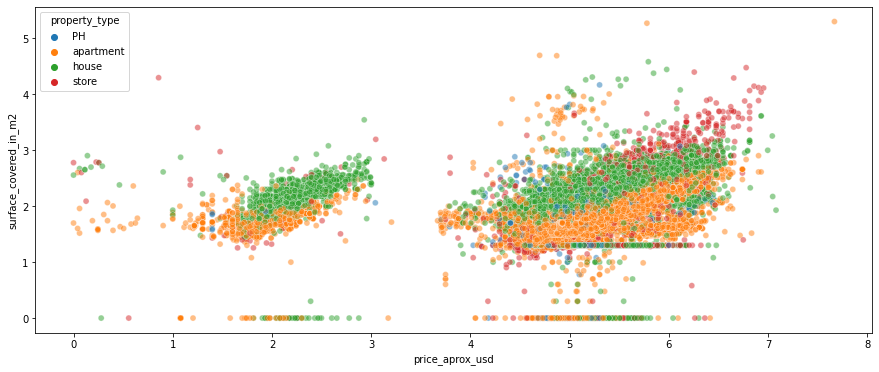

In [50]:
fig= plt.figure(figsize=(15,6))

sns.scatterplot(x=((df6.price_aprox_usd)).apply(lambda x: x if x==0 else np.log10(x)), 
                y=(df6.surface_covered_in_m2).apply(lambda x: x if x==0 else np.log10(x)), hue=df.property_type, alpha=0.5)



#### Se muestra el gráfico para cada tipo de propiedad

Text(0.5, 0, 'log (Price USD)')

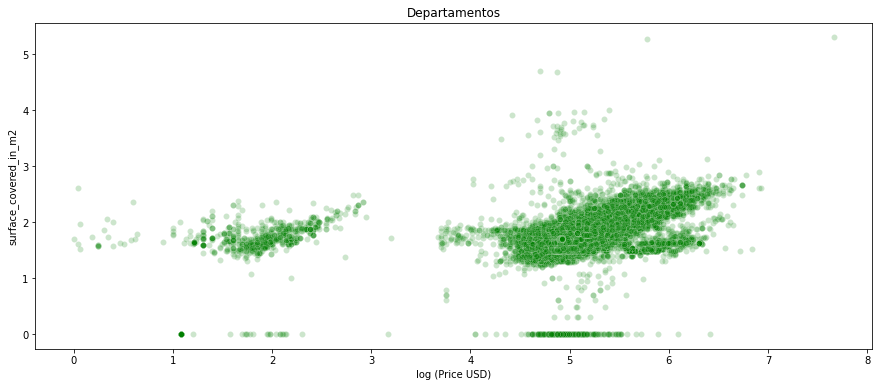

In [51]:

fig= plt.figure(figsize=(15,6))



sns.scatterplot(x=((df6[(df6.property_type == 'apartment')].price_aprox_usd).apply(lambda x: x if x==0 else np.log10(x))), 
                y=(df6[ (df6.property_type == 'apartment')].surface_covered_in_m2).apply(lambda x: x if x==0 else np.log10(x)), 
                color= 'green', alpha=0.2)

plt.title('Departamentos')
plt.xlabel('log (Price USD)')

### Eliminación de outliers

Se eliminan aquellos departamentos cuya superficie cubierta supere los 500 m2

In [52]:
df6.drop(df6[(df6.surface_covered_in_m2>500)&(df6.property_type=="apartment")].index, inplace=True)

Text(0.5, 0, 'log (Price USD)')

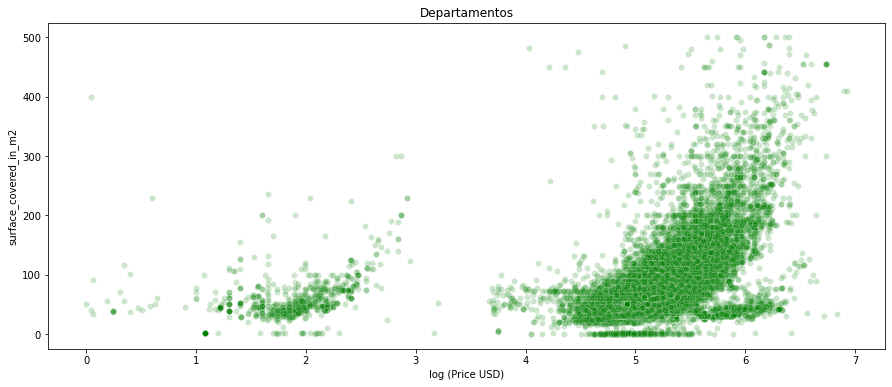

In [53]:
fig= plt.figure(figsize=(15,6))
sns.scatterplot(x=((df6[(df6.property_type == 'apartment')].price_aprox_usd).apply(lambda x: x if x==0 else np.log10(x))), 
                y=(df6[ (df6.property_type == 'apartment')].surface_covered_in_m2),color= 'green', alpha=0.2)
plt.title('Departamentos')
plt.xlabel('log (Price USD)')


Text(0.5, 0, 'log (Price USD)')

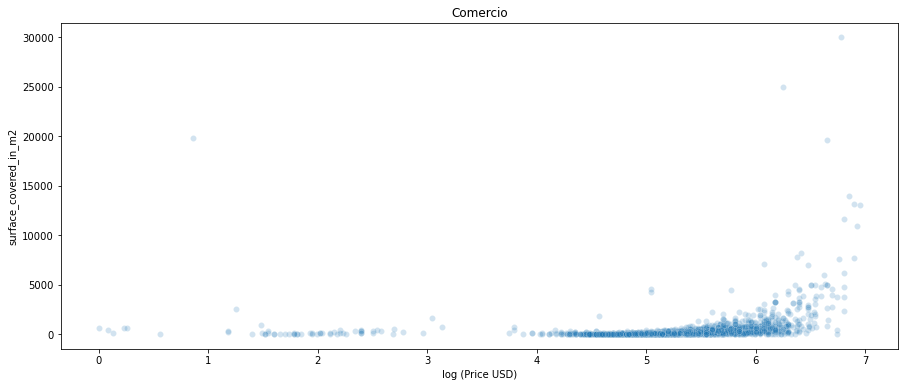

In [54]:
fig= plt.figure(figsize=(15,6))
sns.scatterplot(x=((df6[(df6.property_type == 'store')].price_aprox_usd).apply(lambda x: x if x==0 else np.log10(x))), 
                y=(df6[(df6.property_type == 'store')].surface_covered_in_m2),
                alpha=0.2)
plt.title('Comercio')
plt.xlabel('log (Price USD)')

Se eliminan aquellos comercios cuya superficie cubierta supere los 5000 m2

In [55]:
df6.drop(df6[(df6.surface_covered_in_m2 > 5000) & (df6.property_type == 'store') ].index, inplace=True)


Text(0.5, 0, 'log (Price USD)')

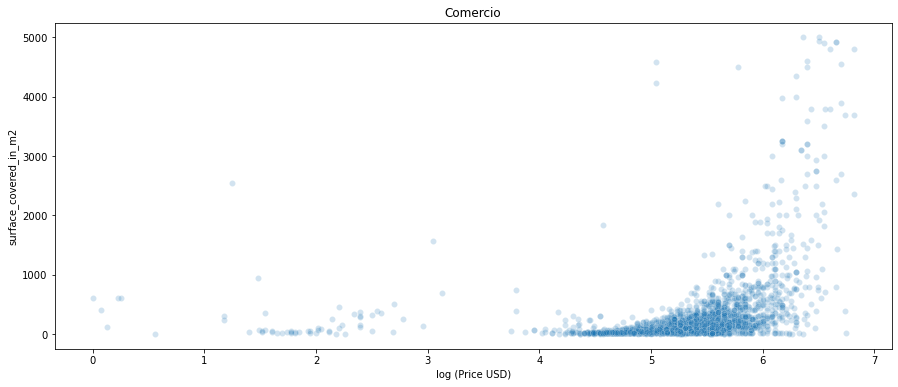

In [56]:
fig= plt.figure(figsize=(15,6))
sns.scatterplot(x=((df6[(df6.property_type == 'store')].price_aprox_usd).apply(lambda x: x if x==0 else np.log10(x))), 
                y=(df6[(df6.property_type == 'store')].surface_covered_in_m2),
                alpha=0.2)
plt.title('Comercio')
plt.xlabel('log (Price USD)')

Text(0.5, 0, 'log (Price USD)')

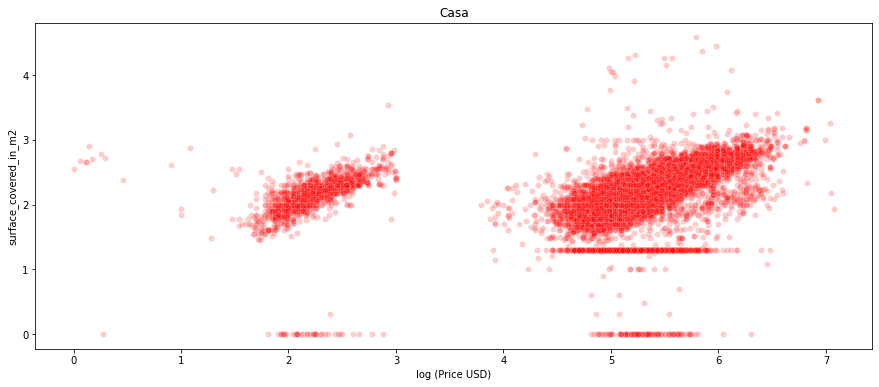

In [57]:
fig= plt.figure(figsize=(15,6))
sns.scatterplot(x=((df6[(df6.property_type == 'house')].price_aprox_usd).apply(lambda x: x if x==0 else np.log10(x))), 
                y=(df6[(df6.property_type == 'house')].surface_covered_in_m2).apply(lambda x: x if x==0 else np.log10(x)),
                color='red', alpha=0.2)
plt.title('Casa')
plt.xlabel('log (Price USD)')

Se eliminan aquellas casas cuya superficie cubierta supere los 1000 m2

In [58]:
df6.drop(df6[(df6.surface_covered_in_m2 > 1000) & (df6.property_type == 'house') ].index, inplace=True)

Text(0.5, 0, 'log (Price USD)')

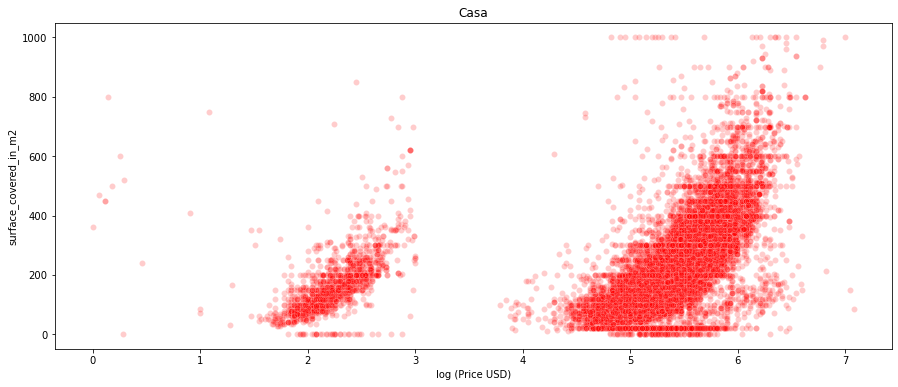

In [59]:
fig= plt.figure(figsize=(15,6))
sns.scatterplot(x=((df6[(df6.property_type == 'house')].price_aprox_usd).apply(lambda x: x if x==0 else np.log10(x))), 
                y=(df6[(df6.property_type == 'house')].surface_covered_in_m2),
                color='red', alpha=0.2)
plt.title('Casa')
plt.xlabel('log (Price USD)')

Text(0.5, 0, 'log (Price USD)')

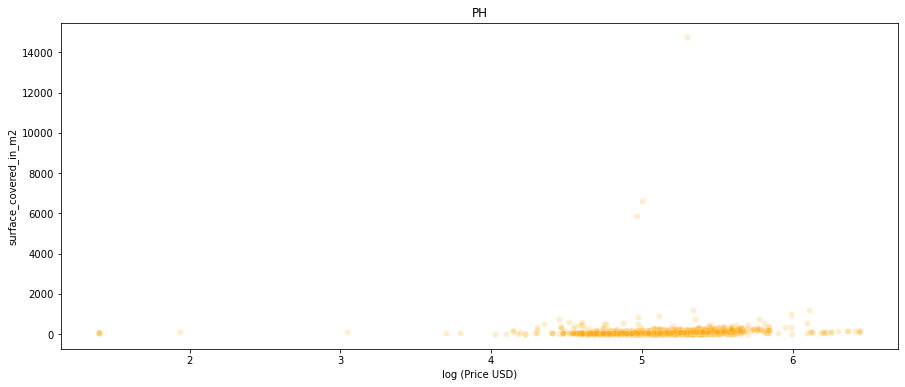

In [60]:
fig= plt.figure(figsize=(15,6))
sns.scatterplot(x=((df6[(df6.property_type == 'PH')].price_aprox_usd).apply(lambda x: x if x==0 else np.log10(x))), 
                y=(df6[(df6.property_type == 'PH')].surface_covered_in_m2),
                color='orange', alpha=0.2)
plt.title('PH')
plt.xlabel('log (Price USD)')

In [61]:
df6.drop(df6[(df6.surface_covered_in_m2 > 800) & (df6.property_type=="PH")].index, inplace=True)

Text(0.5, 0, 'log (Price USD)')

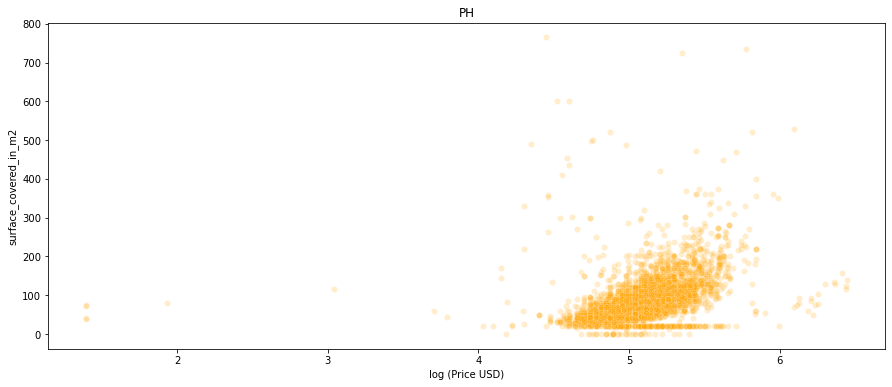

In [62]:
fig= plt.figure(figsize=(15,6))
sns.scatterplot(x=((df6[(df6.property_type == 'PH')].price_aprox_usd).apply(lambda x: x if x==0 else np.log10(x))), 
                y=(df6[(df6.property_type == 'PH')].surface_covered_in_m2),
                color='orange', alpha=0.2)
plt.title('PH')
plt.xlabel('log (Price USD)')

### 3.8) Análisis de precio

In [63]:
df6.currency.value_counts()

USD    85142
ARS    12522
PEN        2
UYU        1
Name: currency, dtype: int64

#### Eliminamos aquellas monedas que tienen pocos valores como PEN y UYU

In [64]:
df6.drop(df6[df6.currency=="PEN"].index, inplace=True)
df6.drop(df6[df6.currency=="UYU"].index, inplace=True)

In [65]:
#OBSERVAMOS QUE LA COLUMNA PRICE Y PRICE_PER_M2 TIENE VALORES EN PESOS Y EN USD
table_price = df6.pivot_table( index=["currency"], values=["price_per_m2", "price"], aggfunc="count")
table_price

,price,price_per_m2
currency,,
ARS,12522,9858
USD,85142,74992


In [66]:
cotizacion = df6.price_aprox_local_currency / df.price_aprox_usd
cotizacion = cotizacion.median()
cotizacion

17.6445

In [67]:
#VOY A CHECKEAR QUE TODOS LOS PRECIOS CUYA CURRENCY ES "USD" TENGAN EL MISMO PRECIO EN LA COLUMNA PRICE_APROX_USD
chequeo_prices = df6.loc[df6.currency=="USD", ["price","price_aprox_usd"]]
all(chequeo_prices.price == chequeo_prices.price_aprox_usd)

#CON UN LOOP:

#def funcion1(data_frame):
#    contador = 0
#    for i in data_frame.index:
#        if df3["currency"][i]=="USD":
#            if df3["price"][i] == df3["price_aprox_usd"][i]:
#                contador+=1
#    return contador

#CORROBORAMOS QUE TODOS LOS VALORES SON IGUALES A PARTIR DE LO SIGUIENTE

#print(funcion1(df3))
#df3.loc[df3.currency=="USD"].shape[0]


#OTRA FORMA DE CORROBORAR 
#df3[df3.currency=="USD"].price.equals(df3[df3.currency=="USD"].price_aprox_usd.astype(float))


True

NO TENGO NINGUN VALOR DE LOCAL CURRENCY QUE PUEDA UTILIZAR PARA SACAR EL PRECIO EN DOLARES A PARTIR DE LA COTIZACION DEL MOMENTO

In [68]:
local_currency_mask = (df6.price_aprox_local_currency.notnull()) & (df6.price_aprox_usd.isnull())
df6.loc[local_currency_mask , ["price_aprox_local_currency","price_aprox_usd"]].shape

(0, 2)

TAMPOCO PUEDO A PARTIR DE LA COLUMNA PRICE

In [69]:
mascara= df6.currency=="ARS"
df6.loc[mascara, ["price","price_aprox_usd"]].isnull().sum()

price              0
price_aprox_usd    0
dtype: int64

VOY A RELLENAR LA COLUMNA DE PRICE_USD_PER_M2 PARA AQUELLOS VALORES DE CURRENCY EN PESOS ARGENTINOS A PARTIR DE LA COLUMNA PRICE_PER_M2 DIVIDO POR LA COTIZACION 

In [70]:
df6.price_usd_per_m2.isnull().sum()/len(df6)

0.4239042437431991

In [71]:
df6.loc[df6.currency=="ARS",["price_per_m2","price_usd_per_m2"]]

,price_per_m2,price_usd_per_m2
9,NaN,NaN
32,11000.000000,616.920400
37,16666.666667,934.727867
97,NaN,NaN
99,4722.222222,238.355600
...,...,...
121199,NaN,1619.955385
121200,NaN,1680.266800
121202,NaN,1625.348077
121203,NaN,1684.753600


In [72]:
df6["price_per_m2_to_usd"] = df6.loc[df6.currency=="ARS", "price_per_m2"]/cotizacion
df6[df6.price_per_m2_to_usd.notnull()]

,Unnamed: 0,property_type,place_name,place_with_parent_names,state_name,geonames_id,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,description,title,place_state_name,price_per_m2_to_usd
32,32,apartment,Córdoba,|Argentina|Córdoba|Córdoba|,Córdoba,3860259.0,-31.405374,-64.156267,550000.0,ARS,544262.59,30846.02,50.0,50.0,616.920400,11000.000000,NaN,3,NaN,"EN VENTA, departamento ubicado en barrio Pueyr...",Departamento apto crédito! Barrio Pueyrredon,CórdobaCórdoba,623.423730
37,37,house,Malagueño,|Argentina|Córdoba|Malagueño|,Córdoba,3845202.0,-31.437318,-64.458006,1250000.0,ARS,1236960.43,70104.59,75.0,75.0,934.727867,16666.666667,NaN,NaN,NaN,Nuevos ingreso:-VENTA-Villa San Nicolas.Presen...,Casa Venta Villa San Nicolas,MalagueñoCórdoba,944.581409
99,99,house,Córdoba,|Argentina|Córdoba|Córdoba|,Córdoba,3860259.0,-31.429542,-64.243804,850000.0,ARS,841133.07,47671.12,200.0,180.0,238.355600,4722.222222,NaN,2,NaN,"CASA: DOS DORMITORIOS, COCINA COMEDOR, LIVING ...",Bº Residencial San Roque.-,CórdobaCórdoba,267.631399
122,122,house,Colón,|Argentina|Entre Ríos|Colón|,Entre Ríos,3435351.0,-32.209711,-58.215034,2600000.0,ARS,2572877.76,145817.55,344.0,188.0,423.888227,13829.787234,NaN,2,NaN,CODIGO: 3852-002 ubicado en: Paso de los Andes...,En venta casa con departamento,ColónEntre Ríos,783.801594
128,128,house,Punilla,|Argentina|Córdoba|Punilla|,Córdoba,3839996.0,-31.418003,-64.509566,1250000.0,ARS,1236960.43,70104.59,129.0,66.0,543.446434,18939.393939,NaN,NaN,NaN,CODIGO: 2557-045 ubicado en: calle quito - Pu...,casita ph a pocas cuandras del centro de carlo...,PunillaCórdoba,1073.387964
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121083,121083,house,San Miguel de Tucumán,|Argentina|Tucumán|San Miguel de Tucumán|,Tucumán,3836873.0,NaN,NaN,3900000.0,ARS,3859316.72,218726.33,200.0,200.0,1093.631650,19500.000000,NaN,3,NaN,Hermosa casa construida en 2 plantas. 3 dormit...,Casa - San Miguel De Tucumán,San Miguel de TucumánTucumán,1105.160248
121091,121091,house,Rosario,|Argentina|Santa Fe|Rosario|,Santa Fe,3838574.0,NaN,NaN,2500000.0,ARS,2473921.05,140209.19,100.0,100.0,1402.091900,25000.000000,NaN,3,NaN,"Duplex, 3 dormitorios (uno de ellos con placar...",Casa - Granadero Baigorria,RosarioSanta Fe,1416.872113
121108,121108,apartment,Rosario,|Argentina|Santa Fe|Rosario|,Santa Fe,3838574.0,NaN,NaN,1000000.0,ARS,989568.31,56083.67,33.0,33.0,1699.505152,30303.030303,NaN,NaN,NaN,GARCIA ANDREU -Negocios Inmobiliarios- Ofrece ...,Departamento Ricchieri al 1100 - Macrocentro,RosarioSanta Fe,1717.420743
121109,121109,apartment,Rosario,|Argentina|Santa Fe|Rosario|,Santa Fe,3838574.0,NaN,NaN,840000.0,ARS,831237.33,47110.28,27.0,25.0,1744.825185,33600.000000,NaN,NaN,NaN,GARCIA ANDREU -Negocios Inmobiliarios- Ofrece ...,Departamento Ricchieri al 1100 - Macrocentro,RosarioSanta Fe,1904.276120


In [73]:
mascara_precios = df6.price_usd_per_m2.isnull()
df6.loc[mascara_precios, "price_usd_per_m2"] = df6.loc[mascara_precios,"price_per_m2_to_usd"]

In [74]:
df6.price_usd_per_m2.isnull().sum()/len(df6)

0.39984330794341677

In [75]:
df6.drop("price_per_m2_to_usd",axis=1,inplace=True)

<AxesSubplot:xlabel='price_usd_per_m2', ylabel='property_type'>

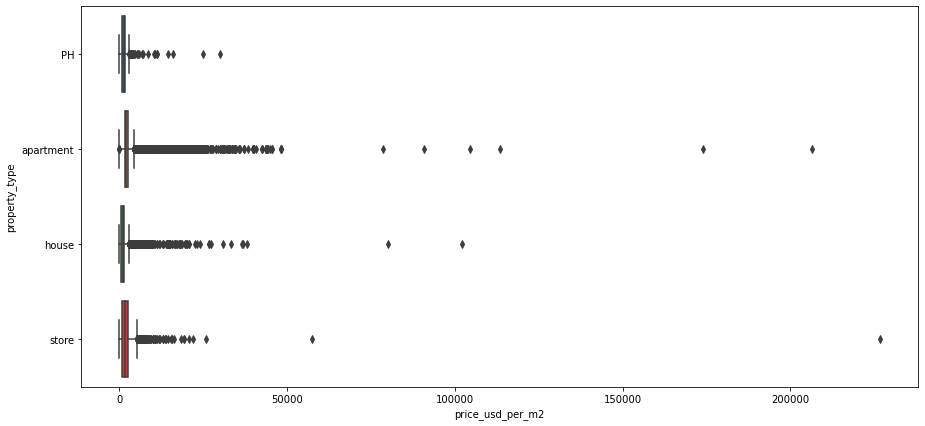

In [76]:
fig= plt.figure(figsize=(15,7))
sns.boxplot(x=df6.price_usd_per_m2, y=df6.property_type)

VOY A REMPLAZAR VALORES NULOS DE PRICE_USD_PER_M2 A PARTIR DE PRICE_PER_M2 PERO SOLO PARA AQUELLOS CUYA CURRENCY SEA USD

In [77]:
mascara_precios = df6.price_usd_per_m2.isnull()
df6.loc[mascara_precios, "price_usd_per_m2"] = df6.loc[mascara_precios & (df6.currency=="USD") 
                                                        ,"price_per_m2"]


In [78]:
df6.price_usd_per_m2.isnull().sum()/len(df)

0.21635796840944416

PODRIAMOS SACAR LA MEDIA DE PRICE_USD_PER_M2 A PARTIR DEL PROPERTY_TYPE Y DE PLACE_NAME Y DE ESTA FORMA IMPUTAR LOS VALORES
FALTANTES CON ESTA MEDIA.


In [79]:
df6_grouped = df6.groupby(["property_type","place_name"])
df6_grouped["price_usd_per_m2"].mean()

property_type  place_name      
PH             Abasto               1570.485350
               Acassuso             2031.161571
               Adrogué              1865.875283
               Agronomía            3782.925093
               Aguas Verdes          545.454545
                                       ...     
store          Villa de Mayo       12500.000000
               Villa del Parque     7243.679741
               Virreyes             5142.727840
               Wilde                 540.616872
               Yerba Buena           694.020321
Name: price_usd_per_m2, Length: 2113, dtype: float64

In [80]:
precios_usd_per_m2_1 = df6_grouped["price_usd_per_m2"].transform(lambda x: x.fillna(x.mean()))
precios_usd_per_m2_1

0         1127.272727
1         1697.177147
2         1309.090909
3         1582.902780
4         1828.571429
             ...     
121215    7699.115044
121216    1383.333333
121217    2858.695652
121218    1997.916667
121219    1675.324675
Name: price_usd_per_m2, Length: 114875, dtype: float64

In [81]:
df6["precios_usd_per_m2_1"]= precios_usd_per_m2_1

In [82]:
df6.price_usd_per_m2 = df6.price_usd_per_m2.fillna(df6.precios_usd_per_m2_1)

In [83]:
df6.price_usd_per_m2.isnull().sum()/len(df6)

0.005466811751904244

#### Eliminación de Outliers

In [84]:
df6.price_usd_per_m2.describe()

count    1.142470e+05
mean     2.662243e+03
std      1.579644e+04
min      6.000000e-01
25%      1.285714e+03
50%      1.833333e+03
75%      2.500000e+03
max      2.600000e+06
Name: price_usd_per_m2, dtype: float64

VOY A QUITAR OUTLIER DE PRICE_USD_PER_M2 POR PROPERTY TYPE

In [85]:
def outliers(df, feature):
    Q1= df[feature].quantile(0.25)
    Q3 = df[feature].quantile(0.75)
    IQR = Q3 - Q1
    upper_limit = Q3 + 1.5 * IQR
    lower_limit = Q1 - 1.5 * IQR
    return upper_limit, lower_limit
upper_hou, lower_hou = outliers(df6[df6.property_type=="house"],"price_usd_per_m2")
print("House Upper: ", upper_hou)
print("House Lower: ", lower_hou)
print("----"*20)
upper_ap, lower_ap = outliers(df6[df6.property_type=="apartment"],"price_usd_per_m2")
print("Apartment Upper: ", upper_ap)
print("Apartment Lower: ", lower_ap)
print("----"*20)
upper_ph, lower_ph = outliers(df6[df6.property_type=="PH"],"price_usd_per_m2")
print("PH Upper: ", upper_ph)
print("PH Lower: ", lower_ph)
print("----"*20)
upper_st, lower_st = outliers(df6[df6.property_type=="store"],"price_usd_per_m2")
print("Store Upper: ", upper_st)
print("Store Lower: ", lower_st)

House Upper:  3098.0392156862745
House Lower:  -614.3790849673202
--------------------------------------------------------------------------------
Apartment Upper:  4193.830593494567
Apartment Lower:  222.94050020408963
--------------------------------------------------------------------------------
PH Upper:  3431.569579754424
PH Lower:  -289.5637574220327
--------------------------------------------------------------------------------
Store Upper:  6251.783659890565
Store Lower:  -1853.76950541331


In [86]:
for x in ["house","apartment","PH","store"]:
    upper, lower = outliers(df6[df6.property_type==x], "price_usd_per_m2")
    print(x.title() ,"Upper", upper)
    print(x.title() ,"Lower", lower)
    l = df6[(df6.property_type==x) & ((df6["price_usd_per_m2"] < lower) | (df6['price_usd_per_m2'] > upper))].index
    df6.drop(l, inplace=True)
    print(df6[(df6.property_type==x)].price_usd_per_m2.describe())
    print("--"*20)

House Upper 3098.0392156862745
House Lower -614.3790849673202
count    37036.000000
mean      1228.286339
std        624.279439
min          2.072029
25%        765.000000
50%       1230.769231
75%       1634.849974
max       3097.345133
Name: price_usd_per_m2, dtype: float64
----------------------------------------
Apartment Upper 4193.830593494567
Apartment Lower 222.94050020408963
count    61678.000000
mean      2191.609575
std        692.476309
min        225.146802
25%       1697.177147
50%       2169.811321
75%       2683.843382
max       4193.548387
Name: price_usd_per_m2, dtype: float64
----------------------------------------
Ph Upper 3431.569579754424
Ph Lower -289.5637574220327
count    5041.000000
mean     1469.460285
std       597.673547
min        36.601307
25%      1067.961165
50%      1375.000000
75%      1841.554849
max      3400.000000
Name: price_usd_per_m2, dtype: float64
----------------------------------------
Store Upper 6251.783659890565
Store Lower -1853.769505

<AxesSubplot:xlabel='price_usd_per_m2', ylabel='property_type'>

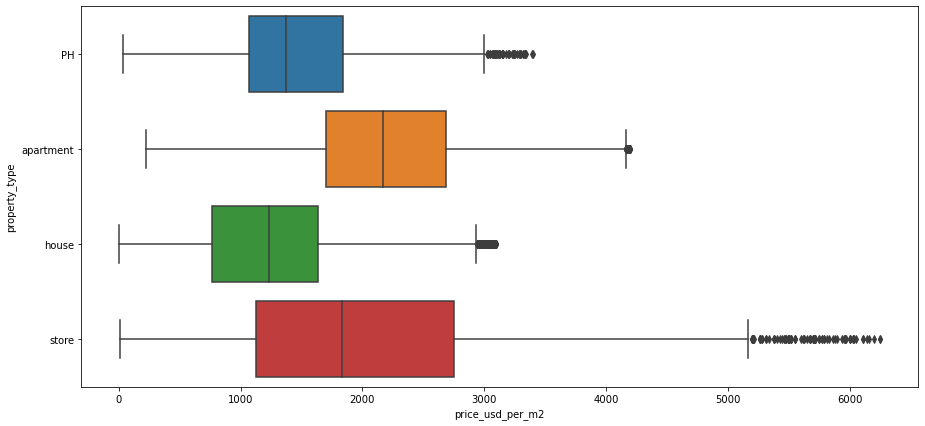

In [87]:
fig= plt.figure(figsize=(15,7))
sns.boxplot(x=df6.price_usd_per_m2, y=df6.property_type)


VAMOS A RELLENAR LOS VALORES DE PRICE_APROX_USD PARA LOS APARTMENTS Y PH

In [88]:
df6["price_aprox_usd_apart"] = df6[df6.property_type=="apartments"].price_usd_per_m2 * df6[df6.property_type=="apartments"].surface_covered_in_m2
df6["price_aprox_usd_ph"] = df6[df6.property_type=="PH"].price_usd_per_m2 * df6[df6.property_type=="PH"].surface_covered_in_m2
df6.price_aprox_usd = df6.price_aprox_usd.fillna(df6.price_aprox_usd_apart)
df6.price_aprox_usd = df6.price_aprox_usd.fillna(df6.price_aprox_usd_ph)

df6.price_aprox_usd.isnull().sum()/len(df6)

0.12719326672901177

## 3.9) Análisis de Amenities

In [89]:
pattern = "balcón"
regex_pattern = re.compile(pattern, re.IGNORECASE)
cadena_reemplazo= "balcon"
df6.description = df6.description.apply(lambda x: x if x is np.NaN else regex_pattern.sub(cadena_reemplazo,x))

In [90]:
lista_atributos=['jardin','cochera','seguridad',"parrilla",'pileta','terraza','subte','lavadero',"quincho", "balcon", "gimnasio"]

for i in lista_atributos:
    atributos=i
    regex_atributo= re.compile(atributos,re.IGNORECASE )
    matches_atributos = df6.description.apply(lambda x: x if x is np.NaN else regex_atributo.search(x))
    print(i , matches_atributos.notnull().sum())
    df6[i]= matches_atributos.notnull().astype(int)

jardin 6989
cochera 37127
seguridad 9418
parrilla 29963
pileta 16979
terraza 24095
subte 6611
lavadero 34998
quincho 11924
balcon 37952
gimnasio 5499


In [91]:
df_correlacion_2=df6.drop(["Unnamed: 0",'property_type', 'place_name', 'place_with_parent_names',
       'state_name', 'geonames_id',  'lat', 'lon','expenses',
       'description', 'title', 'currency', 'price_per_m2', 'price_aprox_usd',
       'surface_total_in_m2', 'surface_covered_in_m2', 'price_aprox_local_currency',
       'price', 'floor', 'rooms',"precios_usd_per_m2_1","place_state_name","price_aprox_usd_apart","price_aprox_usd_ph" ],axis=1)

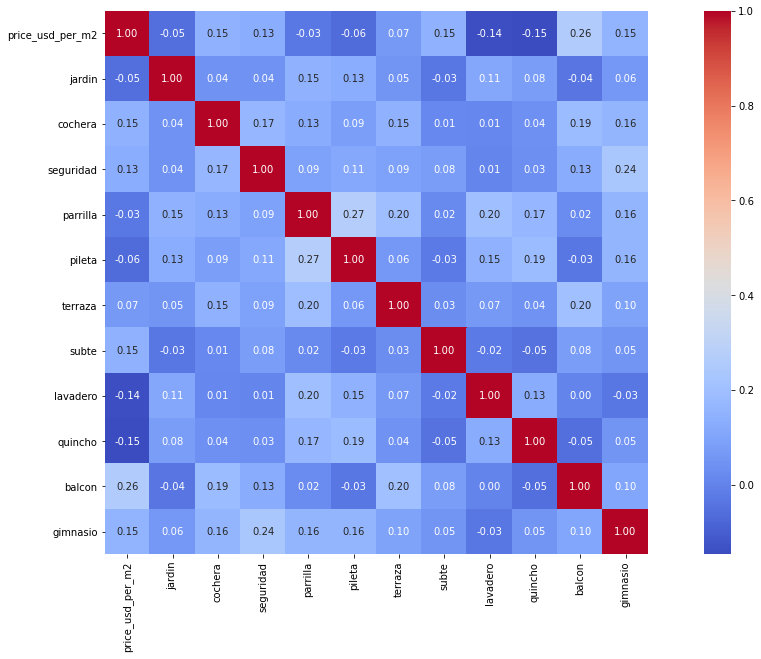

In [92]:
#Visualizaremos una matriz de correlacion
fig= plt.figure(figsize=(20,10))
ax = plt.axes

corr = df_correlacion_2.corr()
ax = sns.heatmap(corr, cbar = True,  square = True, annot=True, fmt= '.2f',annot_kws={'size': 10},
           cmap= 'coolwarm')
plt.show()


# 4) Resultados Obtenidos

### 4.1) Barrios más caros y más baratos

In [93]:
#Se tomaron los barrios que aparecian al menos 6 veces en el dataset
df7 = df6.groupby('place_name').filter(lambda x : len(x)>5)


<AxesSubplot:xlabel='place_name', ylabel='price_usd_per_m2'>

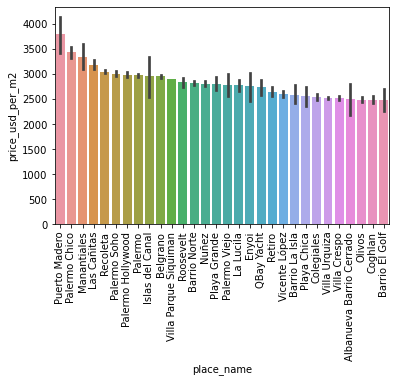

In [106]:
#TOP 30 DE BARRIOS MAS CAROS

plt.xticks(rotation = 90)
barrios = df7.groupby("place_name")["price_usd_per_m2"].mean().sort_values(ascending=False).head(30).index
sns.barplot(x="place_name", y="price_usd_per_m2",order=barrios,data=df7)

<AxesSubplot:xlabel='place_name', ylabel='price_usd_per_m2'>

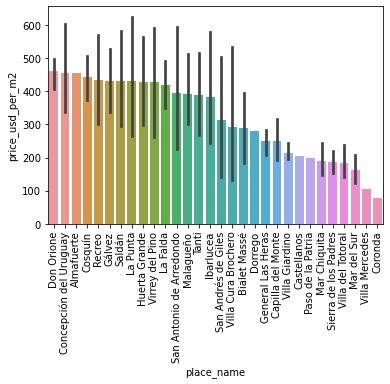

In [95]:
#TOP 30 DE BARRIOS MAS BARATOS
mascara_not_null = df7.price_usd_per_m2.notnull()
df8 = df7[mascara_not_null]

plt.xticks(rotation = 90)
barrios = df8.groupby("place_name")["price_usd_per_m2"].mean().sort_values(ascending=False).tail(30).index
sns.barplot(x="place_name", y="price_usd_per_m2",order=barrios,data=df8)

In [96]:
mas_caros = df7.pivot_table(index="place_name", values="price_usd_per_m2", aggfunc="mean").sort_values(by="price_usd_per_m2"
                                                                ,ascending=False).head(10)
mas_caros

,price_usd_per_m2
place_name,
Puerto Madero,3792.429842
Palermo Chico,3427.519715
Manantiales,3341.945493
Las Cañitas,3183.188068
Recoleta,3044.376203
Palermo Soho,3005.202864
Palermo Hollywood,2982.377140
Palermo,2970.940461
Islas del Canal,2949.869467


In [97]:
mas_baratos = df8.pivot_table(index="place_name", values="price_usd_per_m2", aggfunc="mean").sort_values(by="price_usd_per_m2"
                                                                                                       ,ascending=False).tail(10)
mas_baratos

,price_usd_per_m2
place_name,
Capilla del Monte,248.534234
Villa Giardino,214.965599
Castellanos,204.901506
Paso de la Patria,199.408622
Mar Chiquita,188.874015
Sierra de los Padres,187.889641
Villa del Totoral,183.376448
Mar del Sur,161.708848
Villa Mercedes,104.999120


# Graficando propiedades de los barrios

Ahora que ya sabemos cuales son los barrios más caros y cuales son los más baratos vamos a ver algunas comparaciones gráficas para entender mejor sus diferencias en diferentes atributos del dataset. Vamos a ver las distribuciones según:
- Cuartos totales 
- Precio en dolares por m2

In [98]:
mas_caros_i = mas_caros.index
mas_baratos_i = mas_baratos.index

C:\Users\orest\anaconda3\envs\dhdsblend2021\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\orest\anaconda3\envs\dhdsblend2021\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



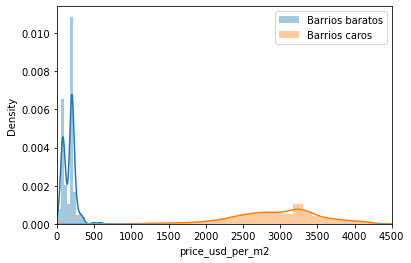

In [99]:
g = sns.distplot(df7[df7.place_name.isin(mas_baratos_i)].price_usd_per_m2, label="Barrios baratos", kde=True)
sns.distplot(df8[df8.place_name.isin(mas_caros_i)].price_usd_per_m2, label="Barrios caros",kde=True)
g.set_xlim(0,4500)
plt.legend()

C:\Users\orest\anaconda3\envs\dhdsblend2021\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\orest\anaconda3\envs\dhdsblend2021\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



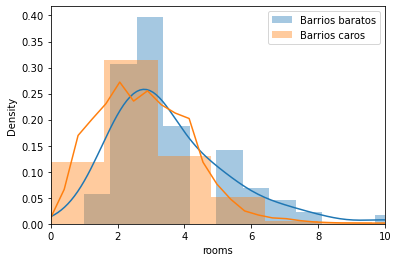

In [100]:
g = sns.distplot(df7[df7.place_name.isin(mas_baratos_i)].rooms, label="Barrios baratos")
sns.distplot(df8[df8.place_name.isin(mas_caros_i)].rooms, label="Barrios caros")
g.set_xlim(0, 10)
plt.legend()


<AxesSubplot:xlabel='place_name', ylabel='price_usd_per_m2'>

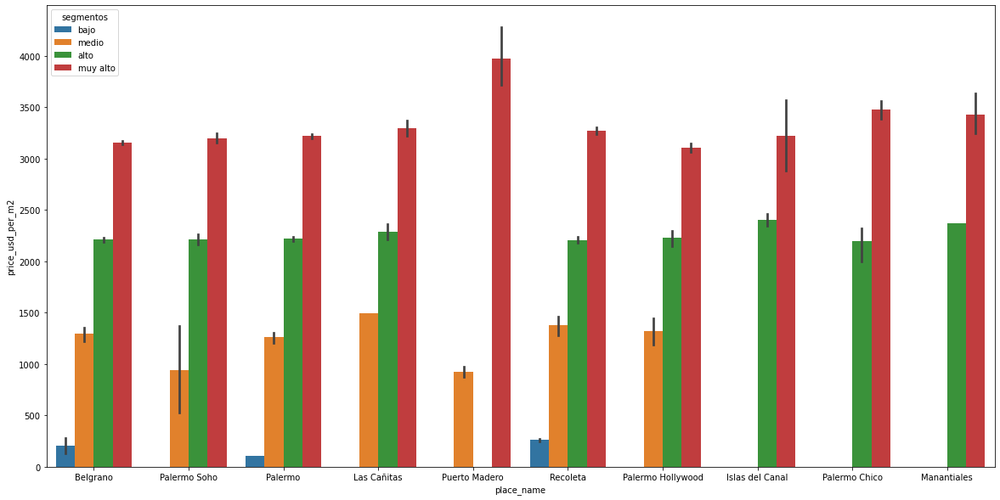

In [101]:
df7["segmentos"]= pd.cut(df6.price_usd_per_m2,bins=[0,500,1500,2500,np.inf], labels=["bajo","medio","alto","muy alto"])

fig= plt.figure(figsize=(20,10))
ax = plt.axes

sns.barplot(data=df7[df7.place_name.isin(mas_caros_i)], x="place_name", y="price_usd_per_m2", hue="segmentos")

<AxesSubplot:xlabel='place_name', ylabel='price_usd_per_m2'>

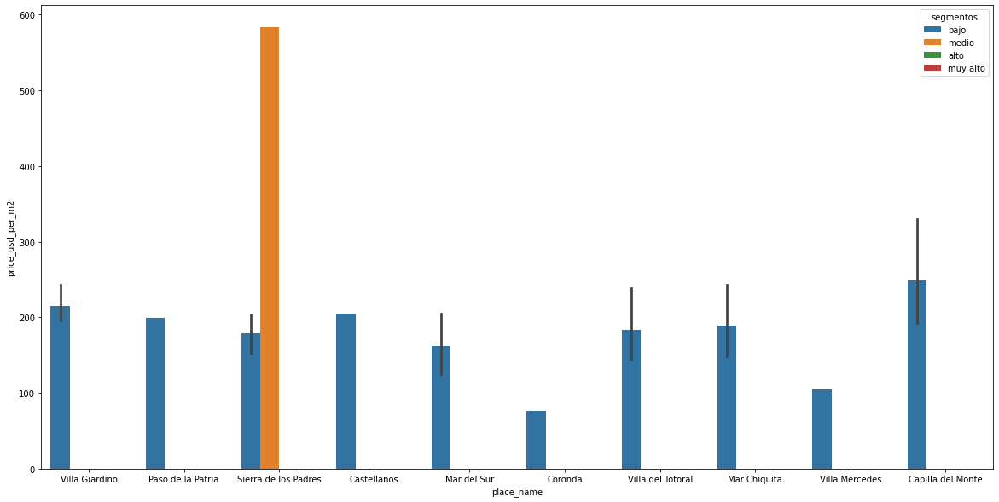

In [102]:
fig= plt.figure(figsize=(20,10))
ax = plt.axes

sns.barplot(data=df7[df7.place_name.isin(mas_baratos_i)], x="place_name", y="price_usd_per_m2", hue="segmentos")

In [103]:
df6.drop(["place_state_name","price_aprox_usd_apart","price_aprox_usd_ph","jardin","cochera","seguridad","parrilla",
          "terraza","subte","lavadero","quincho","balcon","gimnasio","precios_usd_per_m2_1", "pileta"],axis=1, inplace=True)

<Figure size 1080x432 with 0 Axes>

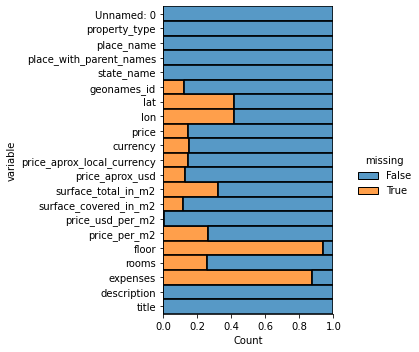

In [104]:
#Volvemos ejecutar el mismo grafico sobre el dataset modificado
#Se representa con un grafico los valores faltantes como "missing"
plt.figure(figsize=(15,6))
sns.displot(data=df6.isna().melt(value_name="missing"), y="variable", hue="missing", multiple="fill", aspect=1)